In [242]:
import caveclient
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import datetime
import tqdm

In [243]:
client=caveclient.CAVEclient('minnie65_phase3_v1')

In [244]:
client.materialize.get_tables()

['allen_v1_column_proofreading',
 'allen_column_basket_molecular',
 'allen_soma_coarse_cell_class_model_v1',
 'allen_v1_column_types_v3',
 'allen_v1_column_types_slanted',
 'nucleus_detection_v0',
 'allen_v1_column_thalamic',
 'proofreading_functional_coreg',
 'aibs_soma_nuc_metamodel_preds_v117',
 'nucleus_neuron_svm',
 'allen_soma_coarse_cell_class_model_v2',
 'pt_synapse_targets',
 'allen_neuron_nonneuron_svm_v0',
 'allen_v1_column_pyc_proof',
 'allen_v1_column_types_v2',
 'synapses_pni_2',
 'slant_data_subtypes',
 'allen_column_l5it_types',
 'proofreading_functional_coreg_v2',
 'l5_mc_cg',
 'slant_data_subtypes_v2',
 'column_excitatory_subgroups_pheno',
 'allen_column_bodor_surround_inhib',
 'cg_cell_type_calls',
 'func_unit_em_match_release',
 'aibs_column_nonneuronal',
 'functional_coreg',
 'baylor_e_i_model_v1',
 'allen_class_type_svm_v0',
 'allen_subclass_type_svm_v0',
 'bodor_pt_target_proofread',
 'bodor_pt_cells',
 'allen_minnie_extra_types',
 'proofreading_status_public_rel

In [245]:
now = datetime.datetime.utcnow()

In [246]:
prf_thal_ids= [ 1,  2,  3,  4, 5, 6,  7,  8,  16, 23, 27,29, 31, 37, 41]

In [247]:
thal_df=client.materialize.query_table('allen_v1_column_thalamic', 
                                       filter_in_dict={'id':prf_thal_ids},timestamp=now)

In [248]:
#thal_df=client.materialize.query_table('allen_v1_column_types_slanted', timestamp=now)

In [249]:
#thal_df=thal_df[thal_df.classification_system=="aibs_coarse_inhibitory"]

In [250]:
no_prf_thal_df = client.materialize.query_table('allen_v1_column_thalamic', 
                                       filter_out_dict={'id':prf_thal_ids},timestamp=now)

In [251]:
no_prf_thal_df

,id,valid,classification_system,cell_type,pt_supervoxel_id,pt_root_id,pt_position
0,9,t,thalamic_axon,unsure,100155270088917657,864691135407429321,"[257348, 214049, 15355]"
1,10,t,thalamic_axon,unsure,102970363923172820,864691135739920276,"[277586, 216564, 18859]"
2,11,t,thalamic_axon,unsure,88612735398879142,864691135013434774,"[173399, 198591, 22365]"
3,12,t,thalamic_axon,unsure,93756663311486109,864691135113516697,"[210494, 250611, 23628]"
4,13,t,thalamic_axon,unsure,113738774512862589,864691135323262620,"[355902, 231589, 17810]"
5,14,t,thalamic_axon,unsure,94245395558999364,864691135841500899,"[214182, 222326, 18574]"
6,15,t,thalamic_axon,unsure,98044140520375170,864691136892558446,"[242022, 213354, 26442]"
7,17,t,thalamic_axon,unsure,103954427634996416,864691135761953846,"[285099, 208131, 24741]"
8,18,t,thalamic_axon,unsure,100223990370974927,864691135576952837,"[257853, 201708, 21502]"
9,19,t,thalamic_axon,unsure,101416754328439337,864691136084365676,"[266375, 175670, 21243]"


In [228]:
tuning_df = pd.read_feather('tuning_curve_oracle.feather')

In [229]:
tuning_df['dsi']=tuning_df.dsi.clip(0,np.percentile(tuning_df.dsi,[99])[0])
tuning_df['osi']=tuning_df.dsi.clip(0,np.percentile(tuning_df.osi,[99])[0])

In [230]:
coreg_df = client.materialize.query_table('functional_coreg', timestamp=now)
coreg_df=coreg_df.drop(['valid', 'pt_supervoxel_id', 'pt_position'], axis=1)

In [231]:
mei_df = pd.read_pickle('/Users/forrestc/Dropbox/dynamic_static_mei.pkl')

In [232]:
thal_df[thal_df.pt_root_id.isin([864691135762227766])]

,id,valid,classification_system,cell_type,pt_supervoxel_id,pt_root_id,pt_position


In [233]:
no_prf_thal_df[no_prf_thal_df.pt_root_id.isin([864691135762227766])]

,id,valid,classification_system,cell_type,pt_supervoxel_id,pt_root_id,pt_position


In [234]:

tuning_coreg=pd.merge(tuning_df, coreg_df, left_on=['scan_session', 'scan_idx', 'unit_id'],
                                           right_on=['session','scan_idx', 'unit_id'])
tuning_coreg=tuning_coreg.drop(['animal_id', 'scan_session'],axis=1)

In [237]:
#thal_ids=thal_df.query('id==23').pt_root_id.values
thal_ids = thal_df.pt_root_id.values
pre_ids_blocks = np.array_split(thal_ids, 4)

In [238]:
syn_dfs = []

for block in tqdm.tqdm_notebook(pre_ids_blocks):
    try:
        syn_dfs.append(client.materialize.synapse_query(pre_ids=block,
                                          split_positions=True,
                                          desired_resolution=[1000,1000,1000],
                                          timestamp=now))
    except:
        try:
            syn_dfs.append(client.materialize.synapse_query(pre_ids=block,
                                          split_positions=True,
                                          desired_resolution=[1000,1000,1000],
                                          timestamp=now))
        except:
            syn_dfs.append(client.materialize.synapse_query(pre_ids=block,
                                          split_positions=True,
                                          desired_resolution=[1000,1000,1000],
                                          timestamp=now))
for df in syn_dfs:
    df.attrs={}
syn_df=pd.concat(syn_dfs)

/var/folders/kx/xq42kw197c5_qw6kxgnr4nkr0000gq/T/ipykernel_1562/4094739899.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for block in tqdm.tqdm_notebook(pre_ids_blocks):


  0%|          | 0/4 [00:00<?, ?it/s]

In [239]:
# syn_df = client.materialize.synapse_query(pre_ids = thal_ids,
#                                           split_positions=True, 
#                                           desired_resolution=[1000,1000,1000], timestamp=now)


In [240]:
syn_df=syn_df.drop(['valid','pre_pt_supervoxel_id','post_pt_supervoxel_id','pre_pt_position_x','pre_pt_position_y','pre_pt_position_z',
            'post_pt_position_x','post_pt_position_y','post_pt_position_z'],axis=1)

(400.0, 800.0)

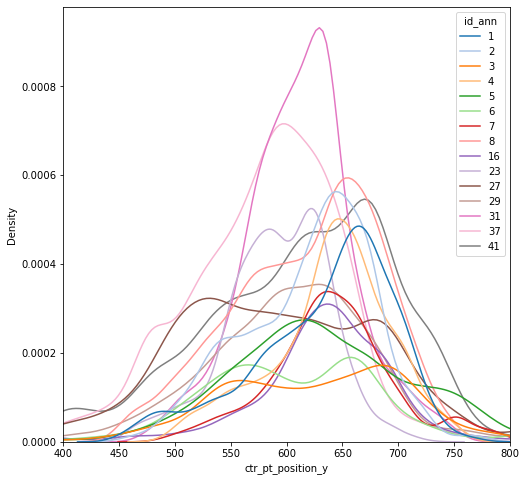

In [241]:
syn_df['pre_pt_short_id']=syn_df.pre_pt_root_id.map(lambda x: str(x)[-5:])
syn_dfm=syn_df.merge(thal_df[['id','pt_root_id']], left_on='pre_pt_root_id', 
                    right_on='pt_root_id',suffixes=['_syn', '_ann'])
syn_dfm=syn_dfm.drop('pt_root_id', axis=1)
f, ax= plt.subplots(figsize=(8,8))
sns.kdeplot(syn_dfm, x='ctr_pt_position_y', hue='id_ann',
             palette='tab20')
plt.xlim(400, 800)

In [192]:
nrn_df = client.materialize.query_table('nucleus_neuron_svm', 
                                        split_positions=True,
                                        desired_resolution=[1000,1000,1000],
                                        filter_equal_dict={'cell_type':'neuron'}, 
                                        timestamp=now)

In [193]:
nrn_df=nrn_df.drop(['valid','pt_supervoxel_id', 'classification_system', 'cell_type'],axis=1)

In [194]:
conn_df = syn_df.groupby(['pre_pt_root_id', 'post_pt_root_id']).aggregate({'size':[np.sum, len]})
conn_df.columns=['sum_size', 'n_syn']
conn_df=conn_df.reset_index()
conn_df['id']=np.arange(0,len(conn_df))

In [195]:
con_dfm = pd.merge(conn_df, nrn_df, left_on='post_pt_root_id', right_on='pt_root_id', how='inner')
con_dfm=con_dfm.drop_duplicates(subset=['id_x'], keep=False)

In [196]:
ct_df = client.materialize.query_table('aibs_soma_nuc_metamodel_preds_v117', timestamp=now)

In [197]:
ct_conn_df = pd.merge(con_dfm, ct_df, on='pt_root_id')

In [198]:
con_tuning=pd.merge(con_dfm, tuning_coreg, on='pt_root_id')

In [199]:
thal_axons_grps=con_tuning.groupby('pre_pt_root_id')

<AxesSubplot:xlabel='pref_dir', ylabel='Count'>

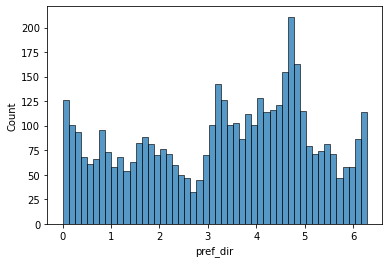

In [206]:
sns.histplot(data = tuning_coreg.query('dsi>.1'), x='pref_dir', bins=50)

In [207]:
np.percentile(tuning_df.osi,[99])[0]+.05

0.42621169119999985

In [208]:
np.percentile(tuning_df.dsi,[99])[0]+.05

0.42621169119999985

In [201]:
dir_norm = plt.Normalize(0, np.pi*2)
ori_norm = plt.Normalize(0, np.pi)
size_norm = plt.Normalize(10000,80000)
        

In [202]:
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.pyplot as plt

# Create the PdfPages object to which we will save the pages:
# The with statement makes sure that the PdfPages object is closed properly at
# the end of the block, even if an Exception occurs.


/var/folders/kx/xq42kw197c5_qw6kxgnr4nkr0000gq/T/ipykernel_1562/1183292402.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(12,8))
/var/folders/kx/xq42kw197c5_qw6kxgnr4nkr0000gq/T/ipykernel_1562/1183292402.py:36: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  out=sns.scatterplot(data=grp_df.query('dsi>.1'), x='pt_position_x', y='pt_position_z', hue='pref_dir',
/var/folders/kx/xq42kw197c5_qw6kxgnr4nkr0000gq/T/ipykernel_1562/1183292402.py:51: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  out=sns.scatterplot(data=grp_df.query('dsi>.1'), x='pt_position_x', y='pt_position_z', hue='pref_ori',
/var/folders/kx/xq42kw197c5_qw6kxgnr4nkr0000gq/T/ipykernel_1562/1183292402.py:36: UserWar

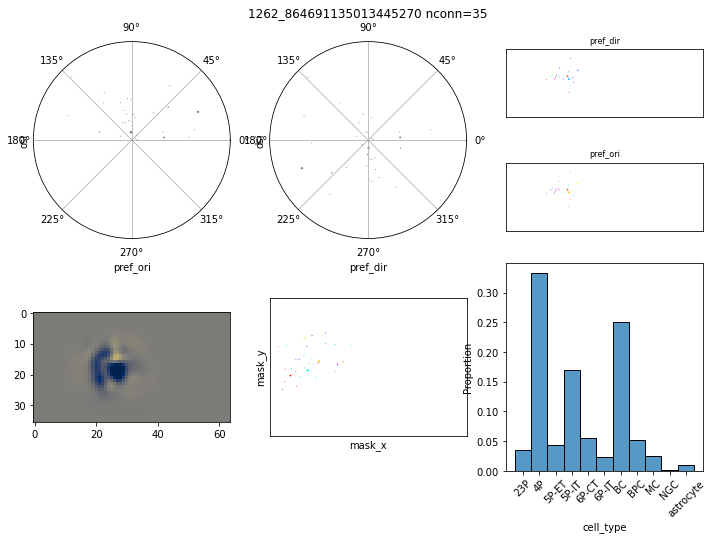

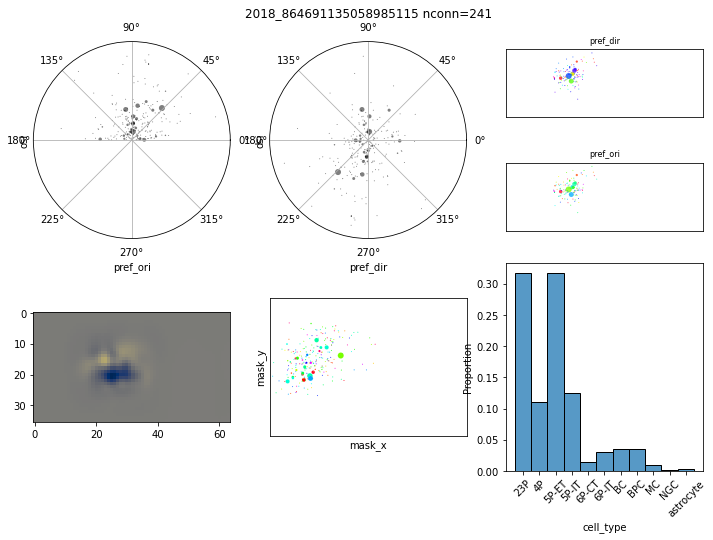

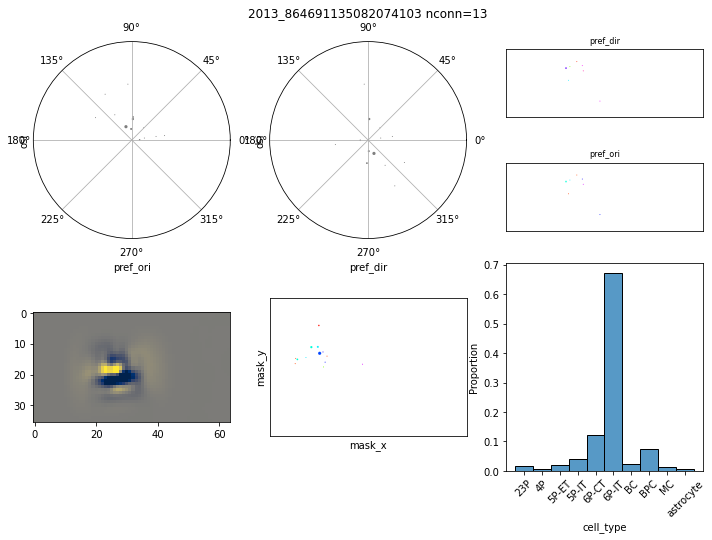

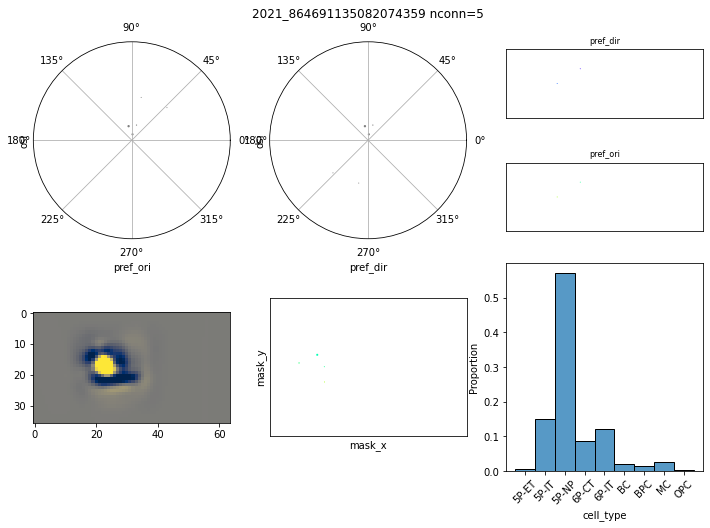

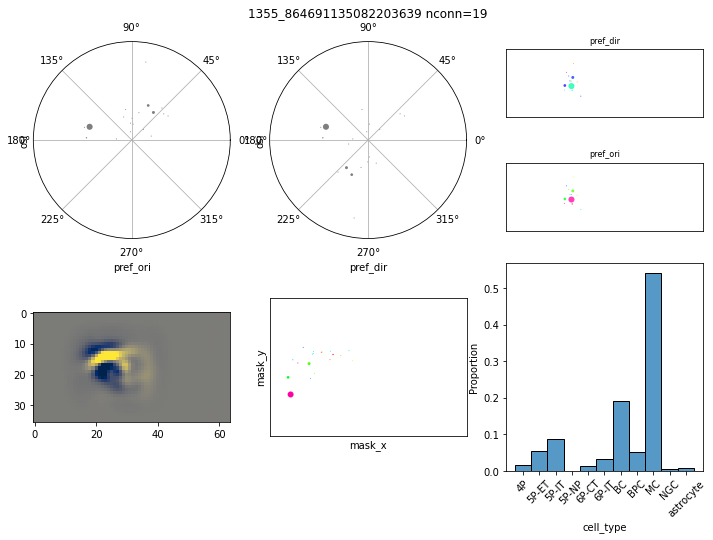

...

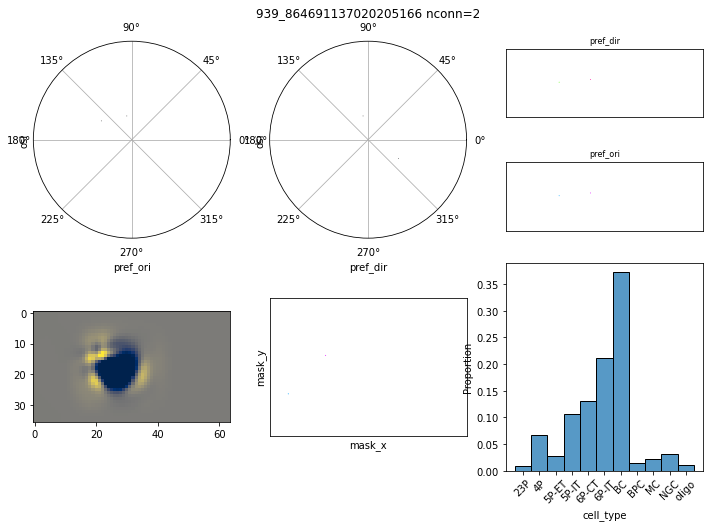

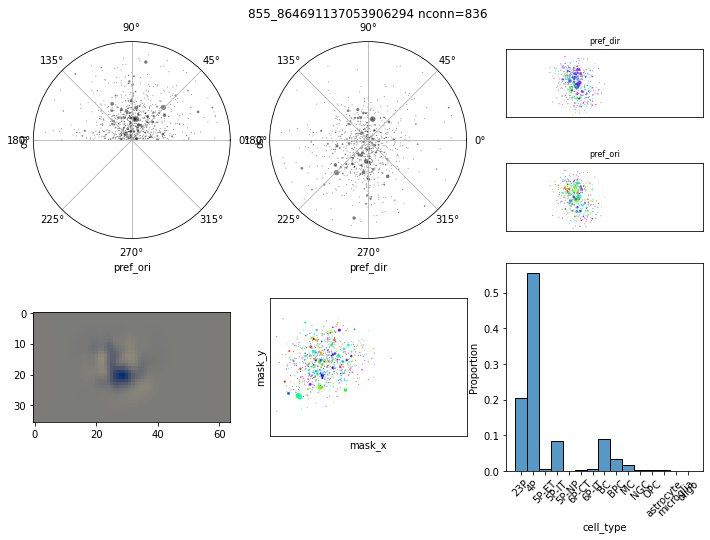

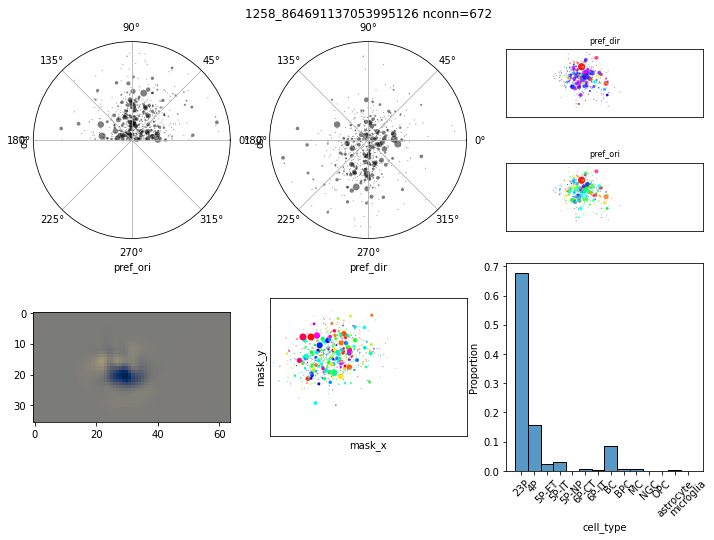

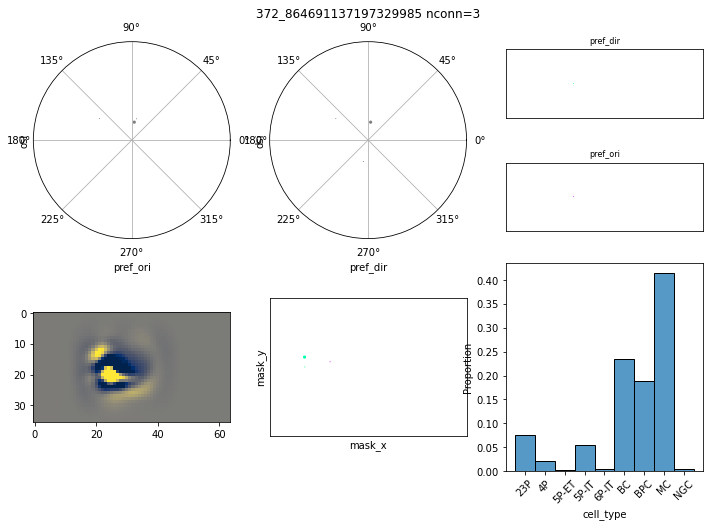

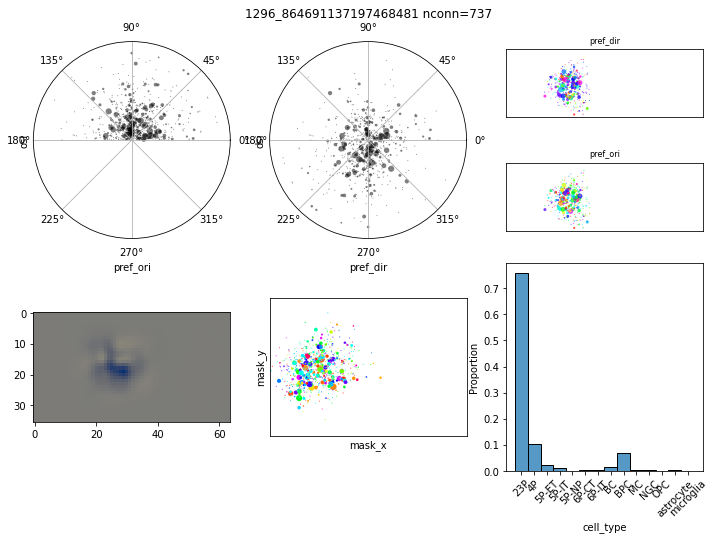

In [204]:

with PdfPages('column_interneurons_10_05_2022.pdf') as pdf:

    for thal_id, grp_df in thal_axons_grps:
            thal_ann_id=thal_df.query(f'pt_root_id=={thal_id}').id.iloc[0]
            f = plt.figure(figsize=(12,8))
            gs = f.add_gridspec(4,3)
        
            ax1 = f.add_subplot(gs[0:2,0],projection='polar')

            #f, ax = plt.subplots(figsize=(8,8))


            sns.scatterplot(data=grp_df, x='pref_ori',
                        y='osi',size='sum_size', sizes=(1,50),
                        c='k',alpha=.5, linewidth=0,
                        size_norm=size_norm,ax=ax1,legend=None)

            ax1.set_ylim(0,np.percentile(tuning_df.osi,[99])[0]+.05)
            ax1.set_yticks([])
            
            ax2 = f.add_subplot(gs[0:2,1],projection='polar')
            sns.scatterplot(data=grp_df, x='pref_dir',
                        y='dsi',size='sum_size', c='k',
                        alpha=.5, linewidth=0, sizes=(1,50),
                        size_norm=size_norm,ax=ax2,legend=None)
                
            ax2.set_ylim(0,np.percentile(tuning_df.dsi,[99])[0]+.05)
            ax2.set_yticks([])
            #ax.set_yscale('log')
            ax2.set_title(f'{thal_ann_id}_{thal_id} nconn={len(grp_df)}')
        

            ax3 = f.add_subplot(gs[0,2])


            out=sns.scatterplot(data=grp_df.query('dsi>.1'), x='pt_position_x', y='pt_position_z', hue='pref_dir', 
                            alpha=.75, sizes=(1,50), linewidth=0,legend=False, size='sum_size',palette='hsv',
                            size_norm=size_norm, hue_norm=dir_norm, ax=ax3)

            ax3.set_title(f'pref_dir',size=8)
            ax3.set_xlim(nrn_df.pt_position_x.min(),nrn_df.pt_position_x.max())
            ax3.set_ylim(nrn_df.pt_position_z.min(),nrn_df.pt_position_z.max())
            ax3.set_xticks([])
            ax3.set_yticks([])
            ax3.set_xlabel("")
            ax3.set_ylabel("")
            ax3.set_aspect('equal')
            
            ax4 = f.add_subplot(gs[1,2])
        
            out=sns.scatterplot(data=grp_df.query('dsi>.1'), x='pt_position_x', y='pt_position_z', hue='pref_ori', 
                            alpha=.75, sizes=(1,50), legend=False, linewidth=0,size='sum_size',palette='hsv',
                            size_norm=size_norm, hue_norm=ori_norm, ax=ax4)

            ax4.set_title(f'pref_ori',size=8)
            ax4.set_xlim(nrn_df.pt_position_x.min(),nrn_df.pt_position_x.max())
            ax4.set_ylim(nrn_df.pt_position_z.min(),nrn_df.pt_position_z.max())
            ax4.set_xticks([])
            ax4.set_yticks([])
            ax4.set_xlabel("")
            ax4.set_ylabel("")
            ax4.set_aspect('equal')

            df_mei_merge=grp_df.merge(mei_df, left_on=['session', 'scan_idx', 'unit_id'],
                right_on=['scan_session', 'scan_idx', 'unit_id'])
            meis= np.stack(df_mei_merge.mei.values)
            weights = df_mei_merge.sum_size.values
            weights=weights/np.sum(weights)
            ax = f.add_subplot(gs[2:4,0])
            m=ax.imshow(np.sum(meis*weights[:,np.newaxis, np.newaxis], axis=0), vmax=.2, vmin=-.2,
                      cmap=plt.cm.cividis)

            ax = f.add_subplot(gs[2:4,1])
            sns.scatterplot(data=df_mei_merge, x='mask_x', y='mask_y', size='sum_size', 
                        sizes=(1,50),size_norm=size_norm, hue='pref_ori', hue_norm=ori_norm, 
                            palette='hsv', ax=ax, legend=False)

            ax.set_xlim(-10,10)
            ax.set_ylim(-7,7)
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_aspect('equal')

            ax = f.add_subplot(gs[2:4,2])

            ctm = ct_conn_df.query(f'pre_pt_root_id=={thal_id}')
            sns.histplot(data=ctm.sort_values('cell_type'), x='cell_type', weights='sum_size',stat='proportion', ax=ax)
            plt.xticks(rotation=45)
            pdf.savefig(f)
            #break
        #f.colorbar(m)
    d = pdf.infodict()
    d['Title'] = 'Column Inteneuron Functional Maps October 2, 2022'
    d['Author'] = 'Forrest Collman'
    d['CreationDate'] = datetime.datetime(2022, 10, 2)
    d['ModDate'] = datetime.datetime.today()

In [54]:

for k, (thal_id, grp_df) in enumerate(thal_axons_grps):
    i,j = np.unravel_index(k, (11,4))
    df_mei_merge=grp_df.merge(mei_df, left_on=['session', 'scan_idx', 'unit_id'],
        right_on=['scan_session', 'scan_idx', 'unit_id'])
    meis= np.stack(df_mei_merge.mei.values)
    weights = df_mei_merge.sum_size.values
    weights=weights/np.sum(weights)
    avg_mei = np.sum(meis*weights[:,np.newaxis, np.newaxis], axis=0)
    avg_center_x = np.sum(df_mei_merge.mask_x.values * weights)
    avg_center_y = np.sum(df_mei_merge.mask_y.values * weights)
    avg_mei_dist = np.abs(np.clip(avg_mei,-np.inf, 0))
    avg_mei_dist = avg_mei_dist/np.sum(avg_mei_dist)
    avg_mei_xcenter=np.sum(avg_mei_dist*xx)
    avg_mei_ycenter=np.sum(avg_mei_dist*yy)
    
    xi,yi=np.searchsorted(x, avg_mei_xcenter), np.searchsorted(y, avg_mei_ycenter)
    df_mei_merge['mei_at_center'] = meis[:,yi,xi]
    
    if thal_id==864691135156084836:
        f, ax = plt.subplots(1, 1, figsize=(6,6))
        sns.scatterplot(data=df_mei_merge, x='mei_at_center', y='osi',
                        sizes=(1,50),size_norm=size_norm, size='sum_size', ax=ax)
        ax.set_xlabel('mei_at_avg_off_center',size=16)
        ax.set_ylabel('osi', size=16)

NameError: name 'xx' is not defined

(332, 36, 64)

-3

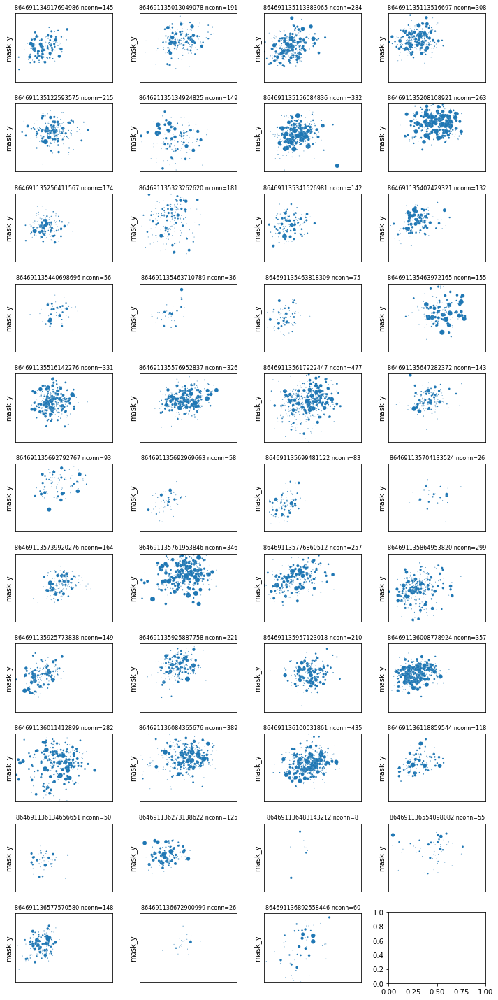

In [926]:

f, ax =plt.subplots(11, 4, figsize=(10,20))


for k, (thal_id, grp_df) in enumerate(thal_axons_grps):
    i,j = np.unravel_index(k, (11,4))
    df_mei_merge=grp_df.merge(mei_df, left_on=['session', 'scan_idx', 'unit_id'],
        right_on=['scan_session', 'scan_idx', 'unit_id'])
    #meis= np.stack(df_mei_merge.mei.values)
    #weights = df_mei_merge.sum_size.values
    #weights=weights/np.sum(weights)
    sns.scatterplot(data=df_mei_merge, x='mask_x', y='mask_y', size='sum_size', 
                    sizes=(1,50),size_norm=size_norm, ax=ax[i,j], legend=False)
#     m=ax[i,j].imshow(np.sum(meis*weights[:,np.newaxis, np.newaxis], axis=0), vmax=.2, vmin=-.2,
#               cmap=plt.cm.cividis)
    ax[i,j].set_title(f'{thal_id} nconn={len(grp_df)}',size=8)
    ax[i,j].set_xlim(-10,10)
    ax[i,j].set_ylim(-7,7)
    ax[i,j].set_xticks([])
    ax[i,j].set_yticks([])
    ax[i,j].set_xlabel("")
    ax[i,j].set_aspect('equal')
f.tight_layout()

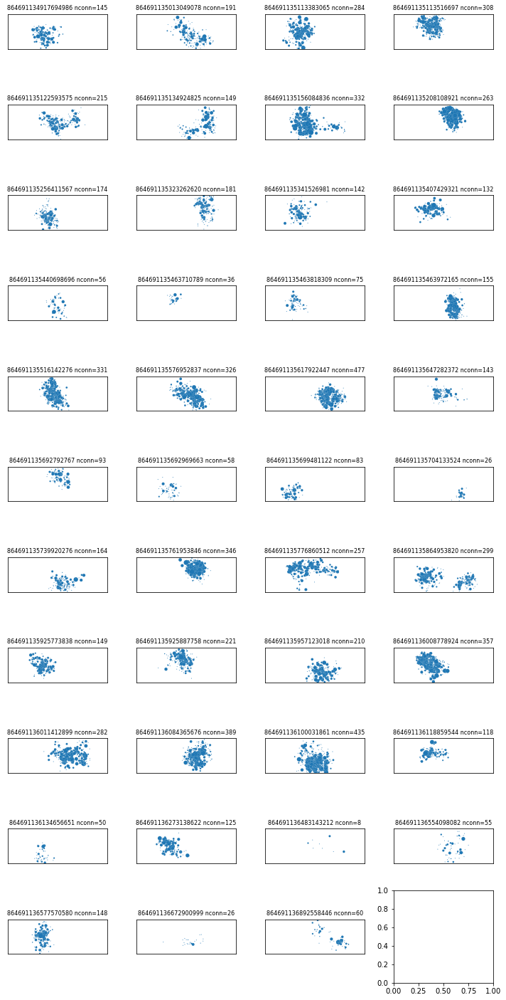

In [927]:

f, ax =plt.subplots(11, 4, figsize=(10,20))


for k, (thal_id, grp_df) in enumerate(thal_axons_grps):
    i,j = np.unravel_index(k, (11,4))
    #df_mei_merge=grp_df.merge(mei_df, left_on=['session', 'scan_idx', 'unit_id'],
    #    right_on=['scan_session', 'scan_idx', 'unit_id'])
    #meis= np.stack(df_mei_merge.mei.values)
    #weights = df_mei_merge.sum_size.values
    #weights=weights/np.sum(weights)
    sns.scatterplot(data=grp_df, x='pt_position_x', y='pt_position_z', size='sum_size', 
                    sizes=(1,50),size_norm=size_norm, ax=ax[i,j], legend=False)
#     m=ax[i,j].imshow(np.sum(meis*weights[:,np.newaxis, np.newaxis], axis=0), vmax=.2, vmin=-.2,
#               cmap=plt.cm.cividis)
    ax[i,j].set_title(f'{thal_id} nconn={len(grp_df)}',size=8)
    ax[i,j].set_xlim(nrn_df.pt_position_x.min(),nrn_df.pt_position_x.max())
    ax[i,j].set_ylim(nrn_df.pt_position_z.min(),nrn_df.pt_position_z.max())
    ax[i,j].set_xticks([])
    ax[i,j].set_yticks([])
    ax[i,j].set_xlabel("")
    ax[i,j].set_ylabel("")
    ax[i,j].set_aspect('equal')
f.tight_layout()

203.328

In [683]:
mean_mei = np.mean(np.stack(mei_df.mei.values),axis=0)

<AxesSubplot:xlabel='mask_x', ylabel='mask_y'>

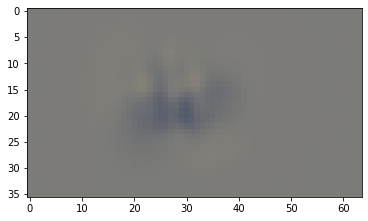

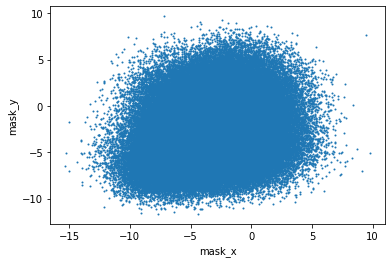

In [695]:
plt.imshow(mean_mei, vmin=-.2, vmax=.2, cmap=plt.cm.cividis)
mei_df.plot(kind='scatter' ,x='mask_x', y='mask_y', s=1)

In [686]:
coreg_mei_df=coreg_df.merge(mei_df, left_on=['session', 'scan_idx', 'unit_id'],
        right_on=['scan_session', 'scan_idx', 'unit_id'])

<AxesSubplot:xlabel='mask_x', ylabel='mask_y'>

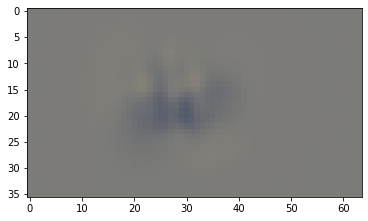

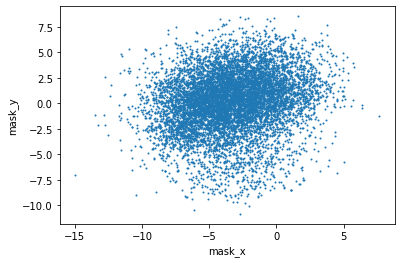

In [696]:
mean_mei = np.mean(np.stack(coreg_mei_df.mei.values),axis=0)
plt.imshow(mean_mei, vmin=-.2, vmax=.2, cmap=plt.cm.cividis)
coreg_mei_df.plot(kind='scatter' ,x='mask_x', y='mask_y', s=1)

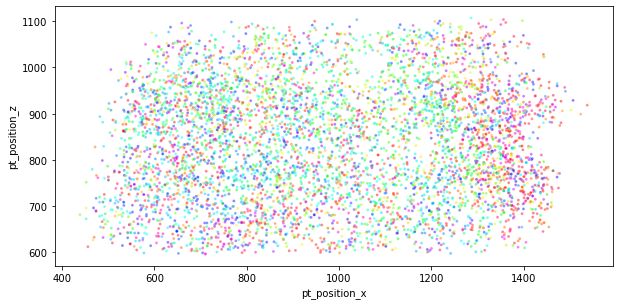

In [413]:
sns.scatterplot(data=pd.merge(tuning_coreg, nrn_df, on='pt_root_id').drop_duplicates(subset=['id_x'], keep=False).query('osi>.2'), 
                hue='pref_ori', palette=plt.cm.hsv, hue_norm=ori_norm, s=8,alpha=.5,legend=False,
                x='pt_position_x', y='pt_position_z', ax=ax)
ax.set_aspect('equal')

,scan_idx,unit_id,direction,response_mean,osi,dsi,pref_dir,pref_ori,oracle,id_x,pt_root_id,session,id_y,pt_position_x,pt_position_y,pt_position_z
0,7,648,"[0.0, 0.3839724354387525, 0.7853981633974483, ...","[0.893511, 0.979927, 0.737722, 0.629444, 0.516...",0.134605,0.205736,3.96807,0.826477,0.119140,7011,864691135348268503,4,516506,1184.832,378.752,632.12
1,7,662,"[0.0, 0.3839724354387525, 0.7853981633974483, ...","[0.0854752, 0.126633, 0.22007, 0.396904, 0.642...",0.528227,0.257282,4.81329,1.671697,0.247518,7631,864691136105667033,4,452329,1076.992,395.328,735.28
2,7,664,"[0.0, 0.3839724354387525, 0.7853981633974483, ...","[0.176015, 0.240971, 0.427563, 0.783951, 1.263...",0.529910,0.309682,4.73852,1.596927,0.095199,9316,864691136124057126,4,452417,1094.912,401.344,780.72
3,7,665,"[0.0, 0.3839724354387525, 0.7853981633974483, ...","[0.894304, 0.875957, 0.867121, 0.743118, 0.670...",0.105512,0.037376,3.47096,0.329367,0.085622,1,864691136136642173,4,451461,1099.456,376.256,881.84
4,7,671,"[0.0, 0.3839724354387525, 0.7853981633974483, ...","[0.047861, 0.0547056, 0.129589, 0.385968, 0.65...",0.573192,0.014278,1.64928,1.649280,0.131064,6241,864691135941155444,4,420222,1039.744,389.440,678.96
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22456,6,4872,"[0.0, 0.3839724354387525, 0.7853981633974483, ...","[0.117437, 0.12029, 0.123438, 0.123223, 0.1343...",0.085329,0.111659,4.61227,1.470677,0.244858,2362,864691135337755110,9,154576,490.944,563.264,663.24
22457,6,4929,"[0.0, 0.3839724354387525, 0.7853981633974483, ...","[0.914922, 0.76024, 0.657818, 0.617298, 0.3709...",0.219615,0.221661,5.84746,2.705867,0.048491,2363,864691136711097710,9,190168,586.176,553.280,723.08
22458,6,4964,"[0.0, 0.3839724354387525, 0.7853981633974483, ...","[0.486821, 0.609885, 0.889355, 0.918988, 0.758...",0.111184,0.055095,4.35960,1.218007,0.110980,4407,864691136541617826,9,552702,1273.408,482.944,647.08
22459,6,4984,"[0.0, 0.3839724354387525, 0.7853981633974483, ...","[0.628352, 0.622654, 0.624781, 0.530281, 0.512...",0.091245,0.087617,2.78742,2.787420,0.029925,4408,864691135809463500,9,581645,1310.784,479.872,616.92


In [261]:
out.get_children()[0]

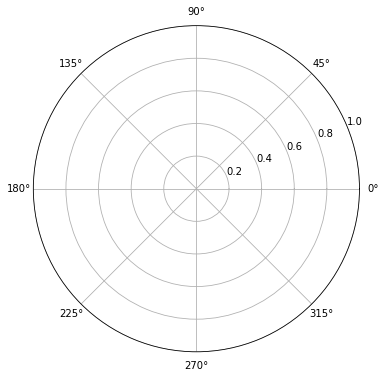

In [388]:
f = plt.figure(figsize=(6,6))
ax = f.add_subplot(projection='polar')


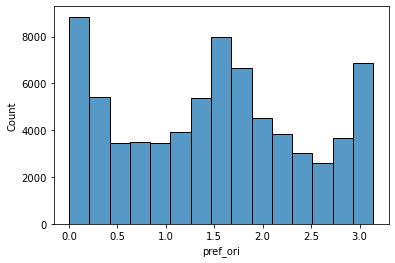

In [389]:
ori_bins=np.linspace(0,np.pi, 16)
sns.histplot(data=tuning_df.query('osi>.2'), x='pref_ori', bins=ori_bins)

density,edges = np.histogram(tuning_df.query('osi>.2').pref_ori, bins=ori_bins)

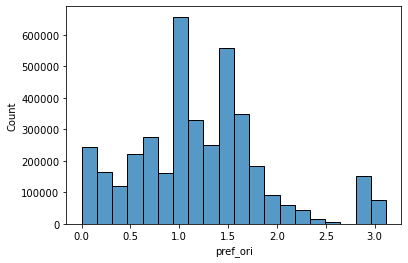

In [391]:
sns.histplot(data=grp_df.query('osi>.2'), x='pref_ori', bins=20, weights='sum_size')
thal_density,edges = np.histogram(grp_df.pref_ori, bins=ori_bins)

<BarContainer object of 15 artists>

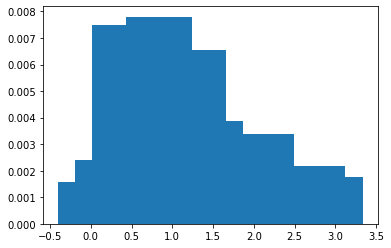

In [392]:
f, ax = plt.subplots()
ax.bar(ori_bins[:-1], thal_density/density)

In [219]:
grp_df[grp_df.pref_dir>np.pi*3/2].query('n_syn>1')

,pre_pt_root_id,post_pt_root_id,sum_size,n_syn,id_x,id_y,pt_position_x,pt_position_y,pt_position_z,pt_root_id,...,unit_id,direction,response_mean,osi,dsi,pref_dir,pref_ori,oracle,id,session
89,864691136084685420,864691135510888400,16148,2,1313,391370,923.712,502.976,992.44,864691135510888400,...,1827,"[0.0, 0.3839724354387525, 0.7853981633974483, ...","[0.381476, 0.318518, 0.38212, 0.885119, 1.8646...",0.504616,0.131207,4.93938,1.797787,0.048183,8479,7
222,864691136084685420,864691136041077334,21416,2,2111,454351,1077.696,484.032,956.88,864691136041077334,...,5117,"[0.0, 0.3839724354387525, 0.7853981633974483, ...","[0.567803, 0.589512, 0.728082, 1.48016, 2.5261...",0.490398,0.231357,4.76488,1.623287,0.145500,3858,7
266,864691136084685420,864691136486784530,9852,2,2374,487544,1176.320,478.912,954.12,864691136486784530,...,4992,"[0.0, 0.3839724354387525, 0.7853981633974483, ...","[1.00569, 0.928624, 0.776006, 1.15996, 1.61932...",0.198954,0.140225,4.85879,1.717197,0.126231,3853,7


In [249]:
syn_df.query('post_pt_root_id==864691135945854244')

,id,pre_pt_root_id,post_pt_root_id,ctr_pt_position_x,ctr_pt_position_y,ctr_pt_position_z,size
75,313384291,864691136084685420,864691135945854244,1068.64,632.384,917.28,43152


In [250]:
client.materialize.synapse_query(pre_ids=864691136084685420, post_ids=864691135945854244, timestamp=now)

,id,valid,pre_pt_supervoxel_id,pre_pt_root_id,post_pt_supervoxel_id,post_pt_root_id,size,pre_pt_position,post_pt_position,ctr_pt_position
0,313384291,t,101484786811886703,864691136084685420,101484786811871405,864691135945854244,43152,"[267186, 158040, 22935]","[267142, 158154, 22925]","[267160, 158096, 22932]"


In [118]:
import importlib


In [119]:
importlib.reload(sns)

<module 'seaborn' from '/opt/anaconda3/envs/caveclient/lib/python3.9/site-packages/seaborn/__init__.py'>

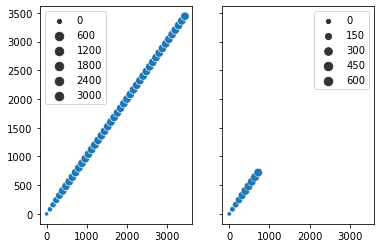

In [27]:
x = np.arange(0, 3500, 80)
f, axs = plt.subplots(1, 2, sharex=True, sharey=True)
sns.scatterplot(x=x, y=x, size=x, size_norm=(1, 400), ax=axs[0])
sns.scatterplot(x=x[:10], y=x[:10], size=x[:10], size_norm=(1, 400), ax=axs[1])
assert np.allclose(axs[0].collections[0].get_sizes()[:10], axs[1].collections[0].get_sizes())

In [54]:
np.percentile(tuning_df.osi, [30,70,99])

array([0.1755193 , 0.3377718 , 0.65371874])

In [55]:
np.percentile(tuning_df.dsi, [30,70,99])

array([0.06660787, 0.137705  , 0.37621828])